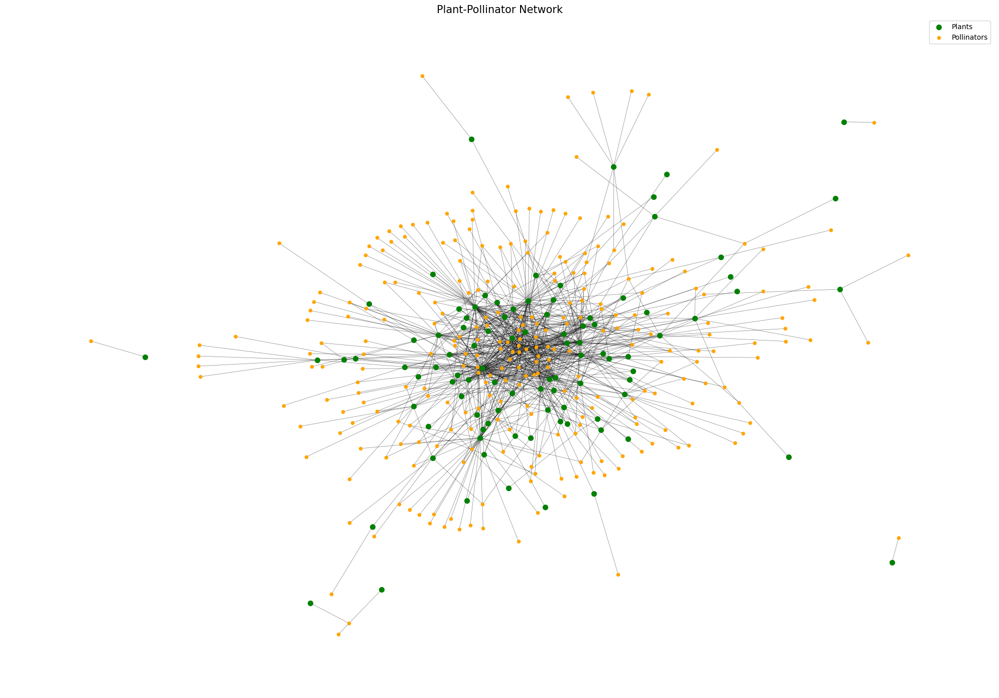

In [ ]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# === Step 1: Load and Clean the CSV ===
file_path = "M_PL_005.csv"
interaction_df = pd.read_csv(file_path, index_col=0)
interaction_matrix_clean = interaction_df.fillna(0).astype(int)

num_plants, num_pollinators = interaction_matrix_clean.shape
total_species = num_plants + num_pollinators

# === Step 2: Construct the Adjacency Matrix ===
adjacency_matrix = np.zeros((total_species, total_species), dtype=int)
adjacency_matrix[0:num_plants, num_plants:total_species] = interaction_matrix_clean.values
adjacency_matrix[num_plants:total_species, 0:num_plants] = interaction_matrix_clean.values.T
np.fill_diagonal(adjacency_matrix, 0)

# === Step 3: Create and Visualize the Network ===
G = nx.from_numpy_array(adjacency_matrix)

# Classify nodes for coloring
plants = list(range(0, num_plants))
pollinators = list(range(num_plants, total_species))

# Generate force-directed layout
pos = nx.spring_layout(G, seed=42, k=0.15)

# Plot
plt.figure(figsize=(20, 14))
nx.draw_networkx_nodes(G, pos, nodelist=plants, node_color='green', node_size=50, label='Plants')
nx.draw_networkx_nodes(G, pos, nodelist=pollinators, node_color='orange', node_size=20, label='Pollinators')
nx.draw_networkx_edges(G, pos, alpha=0.5, width=0.5)

plt.axis('off')
plt.title("Plant-Pollinator Network", fontsize=15)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()


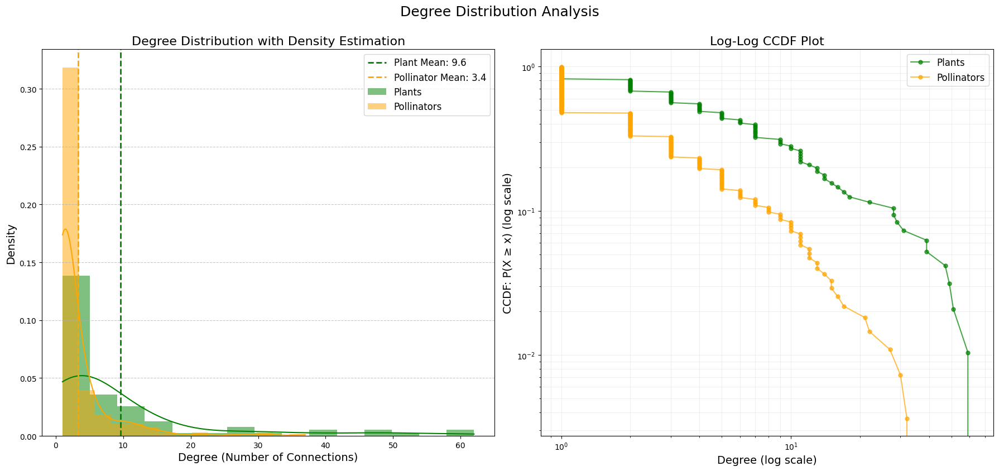

In [ ]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns

# Load and prepare data
file_path = "M_PL_005.csv"
df = pd.read_csv(file_path, index_col=0)
interaction_matrix = df.fillna(0).astype(int)
plants = interaction_matrix.index.tolist()
pollinators = interaction_matrix.columns.tolist()

# Create bipartite graph
B = nx.Graph()
B.add_nodes_from(plants, bipartite=0)
B.add_nodes_from(pollinators, bipartite=1)
for plant in plants:
    for pollinator in pollinators:
        if interaction_matrix.loc[plant, pollinator] == 1:
            B.add_edge(plant, pollinator)

# Calculate degrees
plant_degrees = [B.degree(plant) for plant in plants]
pollinator_degrees = [B.degree(pollinator) for pollinator in pollinators]

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

# 1. Improved histograms with KDE
sns.histplot(plant_degrees, ax=ax1, kde=True, stat="density",
             bins=15, color="green", alpha=0.5, label="Plants", edgecolor="none")
sns.histplot(pollinator_degrees, ax=ax1, kde=True, stat="density",
             bins=15, color="orange", alpha=0.5, label="Pollinators", edgecolor="none")

# Add summary statistics
plant_mean = np.mean(plant_degrees)
poll_mean = np.mean(pollinator_degrees)
ax1.axvline(plant_mean, color='green', linestyle='--', lw=2, label=f'Plant Mean: {plant_mean:.1f}')
ax1.axvline(poll_mean, color='orange', linestyle='--', lw=2, label=f'Pollinator Mean: {poll_mean:.1f}')

ax1.set_xlabel("Degree (Number of Connections)", fontsize=14)
ax1.set_ylabel("Density", fontsize=14)
ax1.set_title("Degree Distribution with Density Estimation", fontsize=16)
ax1.legend(fontsize=12)
ax1.grid(axis='y', linestyle='--', alpha=0.7)

# 2. Log-Log CCDF Plot for power-law analysis
def plot_ccdf(data, ax, label, color):
    # Sort data in ascending order
    sorted_data = np.sort(data)
    # Calculate CCDF (1 - CDF)
    ccdf = 1 - np.arange(1, len(sorted_data) + 1) / len(sorted_data)
    # Plot on log-log scale
    ax.loglog(sorted_data, ccdf, 'o-', label=label, color=color, alpha=0.7, markersize=5)

plot_ccdf(plant_degrees, ax2, 'Plants', 'green')
plot_ccdf(pollinator_degrees, ax2, 'Pollinators', 'orange')
ax2.set_xlabel('Degree (log scale)', fontsize=14)
ax2.set_ylabel('CCDF: P(X ≥ x) (log scale)', fontsize=14)
ax2.set_title('Log-Log CCDF Plot', fontsize=16)
ax2.legend(fontsize=12)
ax2.grid(True, which="both", ls="-", alpha=0.2)

plt.tight_layout()
plt.suptitle('Degree Distribution Analysis', fontsize=18, y=1.05)
plt.show()


In [ ]:
import pandas as pd
import networkx as nx

# === Step 1: Load and Prepare the Data ===
file_path = "M_PL_005.csv"
df = pd.read_csv(file_path, index_col=0)
interaction_matrix = df.fillna(0).astype(int)

plants = interaction_matrix.index.tolist()
pollinators = interaction_matrix.columns.tolist()

# Create a bipartite graph
B = nx.Graph()
B.add_nodes_from(plants, bipartite=0)
B.add_nodes_from(pollinators, bipartite=1)

for plant in plants:
    for pollinator in pollinators:
        if interaction_matrix.loc[plant, pollinator] == 1:
            B.add_edge(plant, pollinator)

# === Step 2: Compute Centrality Metrics ===

# Eigenvector Centrality
eigenvector_centrality = nx.eigenvector_centrality(B)
eigenvector_plants = {node: eigenvector_centrality[node] for node in plants}
eigenvector_pollinators = {node: eigenvector_centrality[node] for node in pollinators}

# Katz Centrality
katz_centrality = nx.katz_centrality(B, alpha=0.01, beta=1.0)
katz_plants = {node: katz_centrality[node] for node in plants}
katz_pollinators = {node: katz_centrality[node] for node in pollinators}

# Betweenness Centrality
betweenness_centrality = nx.betweenness_centrality(B)
betweenness_plants = {node: betweenness_centrality[node] for node in plants}
betweenness_pollinators = {node: betweenness_centrality[node] for node in pollinators}

# Closeness Centrality
closeness_centrality = nx.closeness_centrality(B)
closeness_plants = {node: closeness_centrality[node] for node in plants}
closeness_pollinators = {node: closeness_centrality[node] for node in pollinators}

# HITS Algorithm (Authority and Hub Scores)
hits_scores = nx.hits(B)
authority_scores, hub_scores = hits_scores
authority_pollinators = {node: authority_scores[node] for node in pollinators}
hub_plants = {node: hub_scores[node] for node in plants}

# === Step 3: Get Top 10 Nodes for Each Metric ===

def get_top_10(centralities):
    return sorted(centralities.items(), key=lambda x: x[1], reverse=True)[:10]

top_10_eigenvector_plants = get_top_10(eigenvector_plants)
top_10_eigenvector_pollinators = get_top_10(eigenvector_pollinators)

top_10_katz_plants = get_top_10(katz_plants)
top_10_katz_pollinators = get_top_10(katz_pollinators)

top_10_betweenness_plants = get_top_10(betweenness_plants)
top_10_betweenness_pollinators = get_top_10(betweenness_pollinators)

top_10_closeness_plants = get_top_10(closeness_plants)
top_10_closeness_pollinators = get_top_10(closeness_pollinators)

top_10_hub_plants = get_top_10(hub_plants)
top_10_authority_pollinators = get_top_10(authority_pollinators)

# === Step 4: Display Results ===

print("Top 10 Plants by Eigenvector Centrality:", top_10_eigenvector_plants)
print("Top 10 Pollinators by Eigenvector Centrality:", top_10_eigenvector_pollinators)

print("\nTop 10 Plants by Katz Centrality:", top_10_katz_plants)
print("Top 10 Pollinators by Katz Centrality:", top_10_katz_pollinators)

print("\nTop 10 Plants by Betweenness Centrality:", top_10_betweenness_plants)
print("Top 10 Pollinators by Betweenness Centrality:", top_10_betweenness_pollinators)

print("\nTop 10 Plants by Closeness Centrality:", top_10_closeness_plants)
print("Top 10 Pollinators by Closeness Centrality:", top_10_closeness_pollinators)

print("\nTop 10 Plants by Hub Scores (HITS):", top_10_hub_plants)
print("Top 10 Pollinators by Authority Scores (HITS):", top_10_authority_pollinators)


Top 10 Plants by Eigenvector Centrality: [('Rubus deliciosus', 0.2426124476590887), ('Geranium caespitosum', 0.2322854779914418), ('Rosa acicularis', 0.23109275144956717), ('Pentstemon glaber', 0.21672657275739618), ('Chamaenerium angustifolium', 0.1937746213887186), ('Pentstemon gracilis', 0.18572575279746392), ('Rubus strigosus', 0.166246547864155), ('Monarda fistulosa', 0.1421815233062443), ('Mertensia sibirica', 0.1343434572330315), ('Carduus hookerianus', 0.11211741790554032)]
Top 10 Pollinators by Eigenvector Centrality: [('Bombus edwardsi', 0.19955977739441116), ('Bombus occidentalis', 0.18612079472407775), ('Bombus hunti', 0.17553644480754177), ('Bombus juxtus', 0.1699049867823067), ('Bombus bifarius', 0.1532387860679266), ('Halictus pulzenus', 0.14845909475727362), ('Clisodon terminalis', 0.12746341895842403), ('Bombus appositus', 0.12057759048882268), ('Andrena madronitens', 0.11867791867556916), ('Monumetha albifrons', 0.1186519589805334)]

Top 10 Plants by Katz Centrality: 

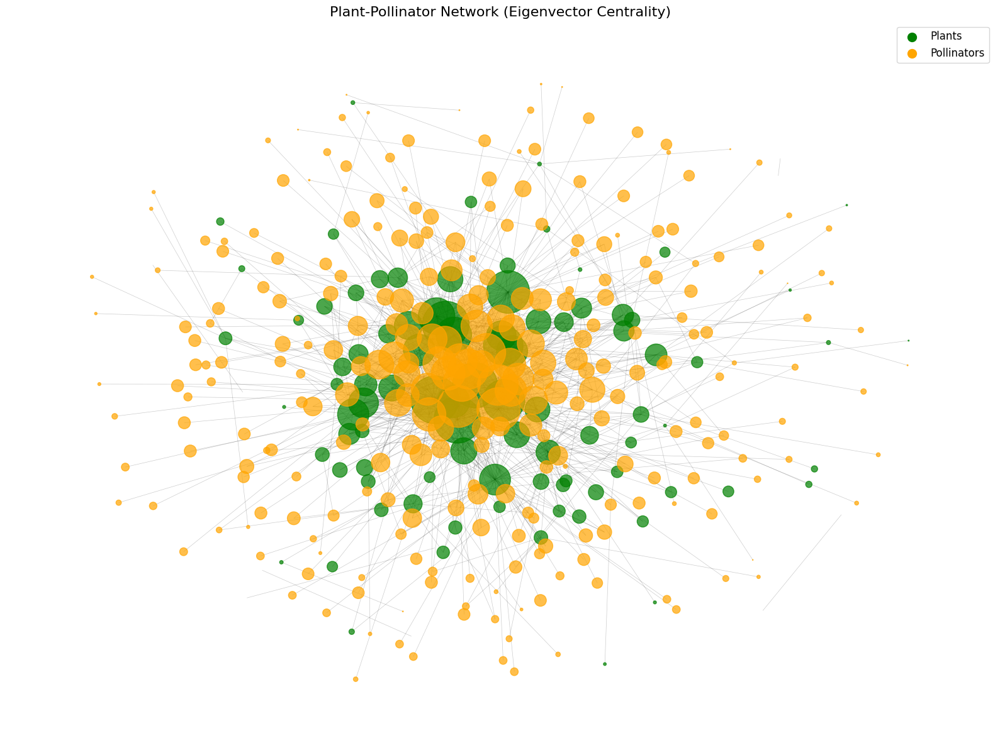

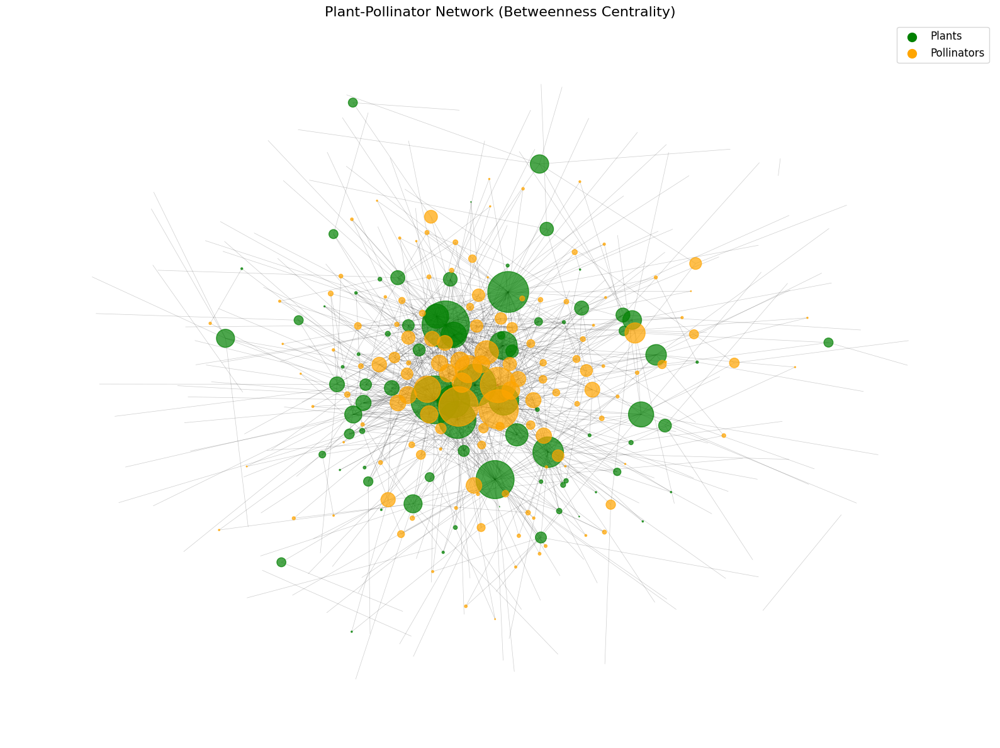

/usr/local/lib/python3.11/dist-packages/matplotlib/collections.py:1008: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


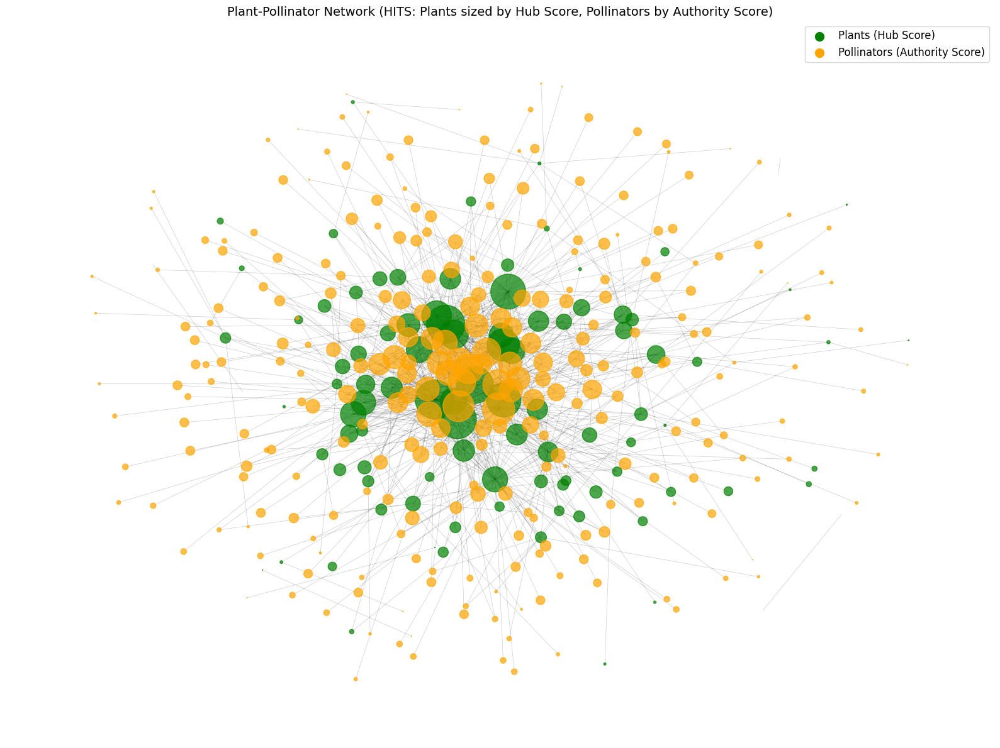

In [ ]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns

# === Step 1: Load and Prepare the Data ===
file_path = "M_PL_005.csv"
df = pd.read_csv(file_path, index_col=0)
interaction_matrix = df.fillna(0).astype(int)

# Extract plant and pollinator nodes
plants = interaction_matrix.index.tolist()
pollinators = interaction_matrix.columns.tolist()

# === Step 2: Construct the Bipartite Network ===
B = nx.Graph()
B.add_nodes_from(plants, bipartite=0)
B.add_nodes_from(pollinators, bipartite=1)

for plant in plants:
    for pollinator in pollinators:
        if interaction_matrix.loc[plant, pollinator] == 1:
            B.add_edge(plant, pollinator)

# === Step 3: Compute Centrality Metrics ===
# Calculate various centrality measures with error handling
try:
    eigenvector_centrality = nx.eigenvector_centrality(B, max_iter=1000)
except nx.PowerIterationFailedConvergence:
    # Find largest connected component if eigenvector calculation fails
    largest_cc = max(nx.connected_components(B), key=len)
    B_sub = B.subgraph(largest_cc)
    eigenvector_centrality = {node: 0.0 for node in B.nodes()}
    sub_centrality = nx.eigenvector_centrality(B_sub, max_iter=1000)
    eigenvector_centrality.update(sub_centrality)

# Katz centrality (with lower alpha to ensure convergence)
katz_centrality = nx.katz_centrality(B, alpha=0.01)

# Betweenness centrality
betweenness_centrality = nx.betweenness_centrality(B)

# Closeness centrality
closeness_centrality = nx.closeness_centrality(B)

# HITS (Hub and Authority scores)
hits_hub, hits_authority = nx.hits(B, max_iter=1000)

# === Step 4: Separate centrality results for plants and pollinators ===
def get_top_nodes(centrality_dict, node_list, n=10):
    """Get top n nodes from a centrality dictionary for a specific node list"""
    filtered_dict = {node: centrality_dict[node] for node in node_list if node in centrality_dict}
    return sorted(filtered_dict.items(), key=lambda x: x[1], reverse=True)[:n]

# Get top plants and pollinators for each centrality measure
top_plants_eigenvector = get_top_nodes(eigenvector_centrality, plants)
top_pollinators_eigenvector = get_top_nodes(eigenvector_centrality, pollinators)

top_plants_katz = get_top_nodes(katz_centrality, plants)
top_pollinators_katz = get_top_nodes(katz_centrality, pollinators)

top_plants_betweenness = get_top_nodes(betweenness_centrality, plants)
top_pollinators_betweenness = get_top_nodes(betweenness_centrality, pollinators)

top_plants_closeness = get_top_nodes(closeness_centrality, plants)
top_pollinators_closeness = get_top_nodes(closeness_centrality, pollinators)

top_plants_hub = get_top_nodes(hits_hub, plants)
top_pollinators_authority = get_top_nodes(hits_authority, pollinators)

# === Step 5: Visualize Network with Different Centrality Measures ===

# Function to visualize network with a specific centrality measure
def visualize_network_with_centrality(G, centrality_dict, title, plants, pollinators):
    plt.figure(figsize=(16, 12))

    # Normalize centrality for node sizing
    max_centrality = max(centrality_dict.values())
    node_sizes = [3000 * centrality_dict[node] / max_centrality for node in G.nodes()]

    # Node colors (blue for plants, green for pollinators)
    node_colors = ['green' if node in plants else 'orange' for node in G.nodes()]

    # Create layout
    pos = nx.spring_layout(G, seed=42, k=0.3)

    # Draw the network
    nx.draw_networkx_edges(G, pos, alpha=0.2, width=0.5)
    nx.draw_networkx_nodes(
        G,
        pos,
        node_size=node_sizes,
        node_color=node_colors,
        alpha=0.7
    )

    # Title and legend
    plt.title(title, fontsize=16)
    plt.axis('off')

    # Add legend
    plt.scatter([], [], c='green', s=100, label='Plants')
    plt.scatter([], [], c='orange', s=100, label='Pollinators')
    plt.legend(fontsize=12)

    plt.tight_layout()
    plt.show()

# === Step 6: Create comparative visualizations ===

# Visualize network with Eigenvector Centrality
visualize_network_with_centrality(B, eigenvector_centrality,
                                 "Plant-Pollinator Network (Eigenvector Centrality)",
                                 plants, pollinators)

# Visualize network with Betweenness Centrality
visualize_network_with_centrality(B, betweenness_centrality,
                                 "Plant-Pollinator Network (Betweenness Centrality)",
                                 plants, pollinators)


# Visualize network with HITS
plt.figure(figsize=(16, 12))

# Normalize hub and authority scores for node sizing
max_hub = max(hits_hub.values())
max_authority = max(hits_authority.values())

# Create node sizes based on role (hub for plants, authority for pollinators)
node_sizes = []
for node in B.nodes():
    if node in plants:
        size = 3000 * hits_hub[node] / max_hub
    else:  # pollinator
        size = 3000 * hits_authority[node] / max_authority
    node_sizes.append(size)

# Node colors
node_colors = ['green' if node in plants else 'orange' for node in B.nodes()]

# Create layout
pos = nx.spring_layout(B, seed=42, k=0.3)

# Draw the network
nx.draw_networkx_edges(B, pos, alpha=0.2, width=0.5)
nx.draw_networkx_nodes(
    B,
    pos,
    node_size=node_sizes,
    node_color=node_colors,
    alpha=0.7
)

# Title and legend
plt.title("Plant-Pollinator Network (HITS: Plants sized by Hub Score, Pollinators by Authority Score)", fontsize=14)
plt.axis('off')

# Add legend
plt.scatter([], [], c='green', s=100, label='Plants (Hub Score)')
plt.scatter([], [], c='orange', s=100, label='Pollinators (Authority Score)')
plt.legend(fontsize=12)

plt.tight_layout()
plt.show()



Network Modularity: 0.397
Number of Communities: 18

Top 16 Hubs by Degree Centrality:
 1. Rubus deliciosus (Plant): 0.168
 2. Geranium caespitosum (Plant): 0.159
 3. Rosa acicularis (Plant): 0.138
 4. Pentstemon glaber (Plant): 0.132
 5. Chamaenerium angustifolium (Plant): 0.127
 6. Pentstemon gracilis (Plant): 0.105
 7. Prunus demissa (Plant): 0.105
 8. Bombus edwardsi (Pollinator): 0.100
 9. Bombus occidentalis (Pollinator): 0.086
10. Monarda fistulosa (Plant): 0.084
11. Bombus hunti (Pollinator): 0.081
12. Mertensia sibirica (Plant): 0.078
13. Carduus hookerianus (Plant): 0.076
14. Rubus strigosus (Plant): 0.076
15. Bombus juxtus (Pollinator): 0.073
16. Erigeron macranthus (Plant): 0.059


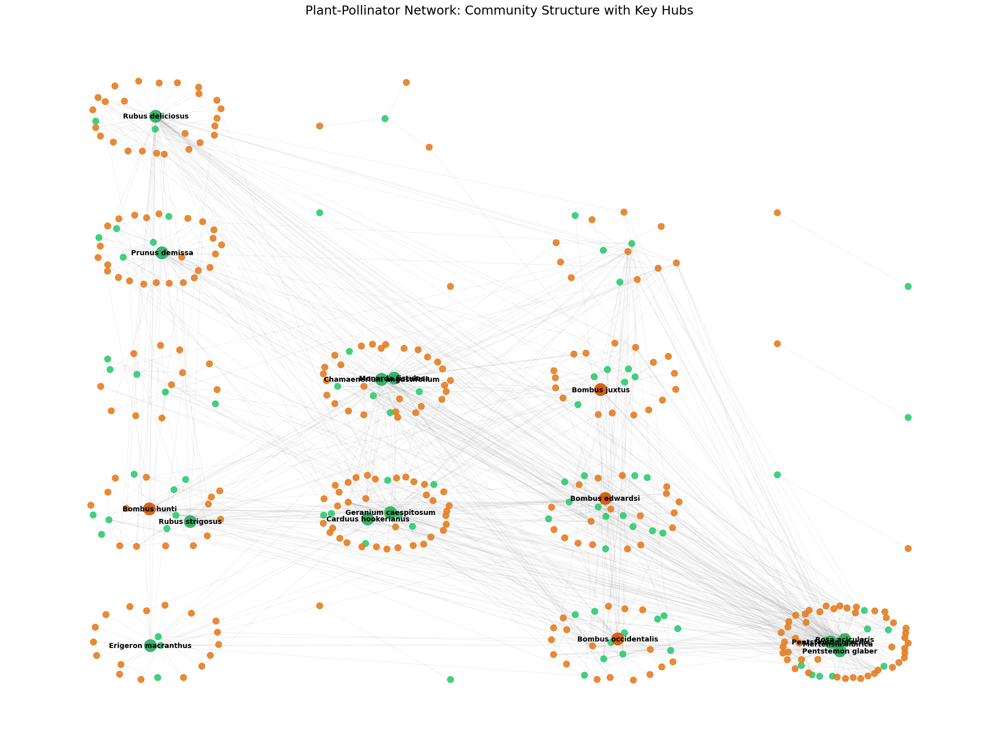

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from community import community_louvain
import numpy as np

# === Step 1: Load Data with Error Handling ===
file_path = "M_PL_005.csv"
try:
    df = pd.read_csv(file_path, index_col=0)
except FileNotFoundError:
    print(f"Error: File '{file_path}' not found.\n"
          "1. Verify the file exists in your current directory\n"
          "2. Provide full path if needed (e.g., '/folder/M_PL_005.csv')")
    exit()

# === Step 2: Build Bipartite Network ===
interaction_matrix = df.fillna(0).astype(int)
plants = interaction_matrix.index.tolist()
pollinators = interaction_matrix.columns.tolist()

B = nx.Graph()
B.add_nodes_from(plants, bipartite=0)  # Plants
B.add_nodes_from(pollinators, bipartite=1)  # Pollinators

for plant in plants:
    for pollinator in pollinators:
        if interaction_matrix.loc[plant, pollinator] == 1:
            B.add_edge(plant, pollinator)

# === Step 3: Community Detection ===
partition = community_louvain.best_partition(B)
print(f"\nNetwork Modularity: {community_louvain.modularity(partition, B):.3f}")
print(f"Number of Communities: {len(set(partition.values()))}")

# === Step 4: Identify and Print Top Hubs ===
degree_centrality = nx.degree_centrality(B)
top_hubs = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:16]

print("\nTop 16 Hubs by Degree Centrality:")
for rank, (node, score) in enumerate(top_hubs, 1):
    node_type = "Plant" if node in plants else "Pollinator"
    print(f"{rank:2d}. {node} ({node_type}): {score:.3f}")

# === Step 5: Visualize Network with Communities ===
plt.figure(figsize=(20, 15))

# Create positions for communities in grid layout
pos = {}
for comm_id in set(partition.values()):
    nodes = [n for n in B.nodes() if partition[n] == comm_id]
    subgraph = B.subgraph(nodes)

    # Position communities in 4-column grid
    col = comm_id % 4
    row = comm_id // 4
    base_pos = nx.spring_layout(subgraph, k=1.5, seed=42)

    # Offset communities with spacing
    for node, (x, y) in base_pos.items():
        pos[node] = (x + col*3.5, y + row*3.5)  # Increased horizontal spacing

# Draw network elements
nx.draw_networkx_edges(B, pos, alpha=0.1, edge_color="gray")

# Color nodes by type (plants: green, pollinators: orange)
node_colors = ["#2ecc71" if n in plants else "#e67e22" for n in B.nodes()]
nx.draw_networkx_nodes(
    B, pos,
    node_size=80,
    node_color=node_colors,
    alpha=0.9
)

# Highlight and label hubs
hub_nodes = [node for node, _ in top_hubs]
nx.draw_networkx_nodes(
    B, pos,
    nodelist=hub_nodes,
    node_size=300,
    node_color=["#27ae60" if n in plants else "#d35400" for n in hub_nodes],
    alpha=0.9
)
nx.draw_networkx_labels(
    B, pos,
    labels={n: n for n in hub_nodes},
    font_size=10,
    font_weight="bold",
    font_family="sans-serif"
)

plt.title("Plant-Pollinator Network: Community Structure with Key Hubs", fontsize=18)
plt.axis("off")
plt.tight_layout()
plt.show()


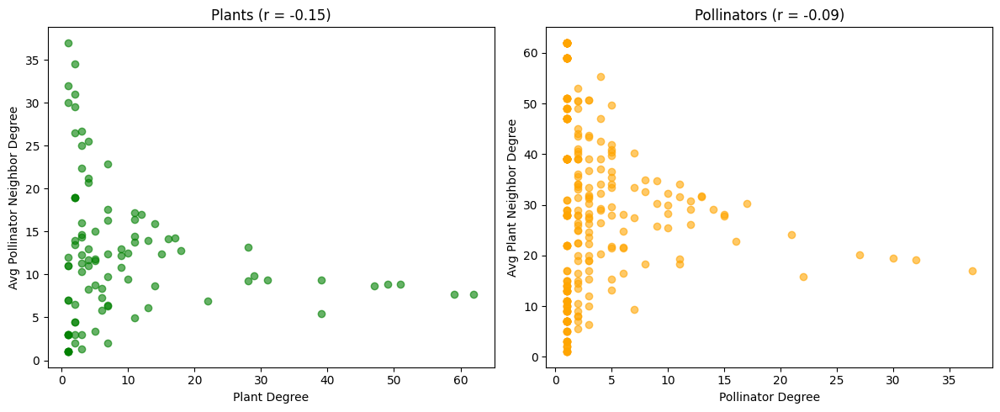


Interpretation:
Plant correlation (r = -0.15): Disassortative (high-degree plants connect to low-degree pollinators)
Pollinator correlation (r = -0.09): Neutral correlation


In [ ]:
import pandas as pd
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

# === Step 1: Load Data with Error Handling ===
try:
    df = pd.read_csv("M_PL_005.csv", index_col=0)
except FileNotFoundError:
    print("Error: File 'M_PL_005.csv' not found.")
    print("1. Ensure the file exists in your current directory")
    print("2. Or provide the full path to the file")
    exit()

# === Step 2: Build Bipartite Network ===
interaction_matrix = df.fillna(0).astype(int)
plants = interaction_matrix.index.tolist()
pollinators = interaction_matrix.columns.tolist()

B = nx.Graph()
B.add_nodes_from(plants, bipartite=0)
B.add_nodes_from(pollinators, bipartite=1)
B.add_edges_from(
    (plant, pollinator)
    for plant in plants
    for pollinator in pollinators
    if interaction_matrix.loc[plant, pollinator] == 1
)

# === Step 3: Degree-Degree Correlation Analysis ===
def analyze_assortativity(nodes, neighbor_type):
    """Calculate degree vs neighbor degree correlations for a node group"""
    degrees = []
    avg_neighbor_degrees = []

    for node in nodes:
        # Get neighbors from the opposite partition
        neighbors = list(B.neighbors(node))
        if not neighbors:
            continue

        # Calculate average neighbor degree
        neighbor_degrees = [B.degree(n) for n in neighbors]
        avg_neighbor_deg = np.mean(neighbor_degrees)

        degrees.append(B.degree(node))
        avg_neighbor_degrees.append(avg_neighbor_deg)

    # Calculate Pearson correlation
    r = np.corrcoef(degrees, avg_neighbor_degrees)[0, 1]
    return degrees, avg_neighbor_degrees, r

# Analyze plants (connected to pollinators)
plant_degrees, plant_neighbor_degs, plant_r = analyze_assortativity(plants, "pollinator")

# Analyze pollinators (connected to plants)
pollinator_degrees, pollinator_neighbor_degs, pollinator_r = analyze_assortativity(pollinators, "plant")

# === Step 4: Visualization ===
plt.figure(figsize=(12, 5))

# Plant plot
plt.subplot(1, 2, 1)
plt.scatter(plant_degrees, plant_neighbor_degs, alpha=0.6, color='green')
plt.title(f"Plants (r = {plant_r:.2f})")
plt.xlabel("Plant Degree")
plt.ylabel("Avg Pollinator Neighbor Degree")

# Pollinator plot
plt.subplot(1, 2, 2)
plt.scatter(pollinator_degrees, pollinator_neighbor_degs, alpha=0.6, color='orange')
plt.title(f"Pollinators (r = {pollinator_r:.2f})")
plt.xlabel("Pollinator Degree")
plt.ylabel("Avg Plant Neighbor Degree")

plt.tight_layout()
plt.show()

# === Step 5: Interpretation ===
print("\nInterpretation:")
print(f"Plant correlation (r = {plant_r:.2f}): ", end="")
if plant_r > 0.1:
    print("Assortative (high-degree plants connect to high-degree pollinators)")
elif plant_r < -0.1:
    print("Disassortative (high-degree plants connect to low-degree pollinators)")
else:
    print("Neutral correlation")

print(f"Pollinator correlation (r = {pollinator_r:.2f}): ", end="")
if pollinator_r > 0.1:
    print("Assortative (high-degree pollinators connect to high-degree plants)")
elif pollinator_r < -0.1:
    print("Disassortative (high-degree pollinators connect to low-degree plants)")
else:
    print("Neutral correlation")



Top 10 Plants by Clustering Coefficient:
Lappula floribunda: 0.3647
Prunus pennsylvanica: 0.3647
Valeriana edulis: 0.2283
Aragalus lamberti: 0.1811
Lithospermum canescens: 0.1811
Pedicularis racemosa: 0.1743
Caltha leptosepala: 0.1708
Aconitum columbianum: 0.1625
Lathyrus ornatus: 0.1584
Sieversia ciliata: 0.1563

Top 10 Pollinators by Clustering Coefficient:
Hyloicus separatus: 0.7500
Protoparce quinquemaculatus: 0.7500
Agathis vulgaris: 0.6722
Halicyoides mamus: 0.6722
Synanthedon albicornis: 0.6722
Trypeta occidentalis: 0.6722
Bembix spinolae: 0.5428
Pseudomelecta californica miranda: 0.5428
Tetraopes sp1 M_PL_005: 0.5428
Triepeolus helianthi grandior: 0.5428


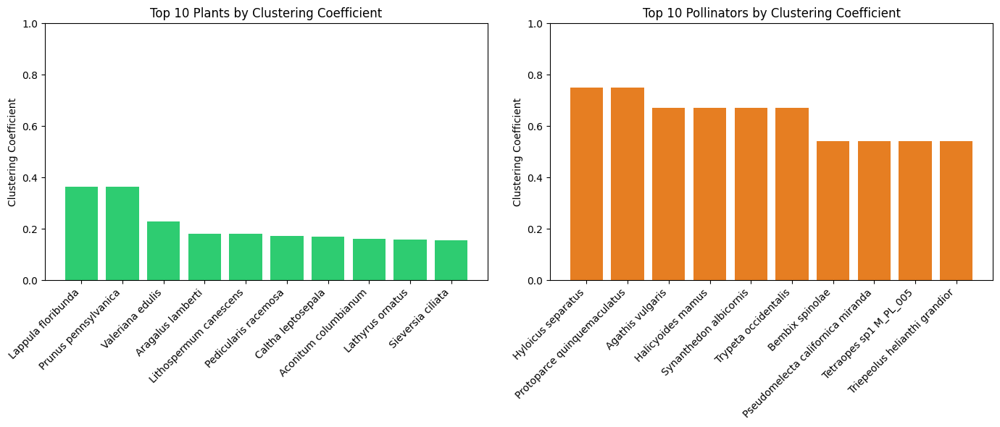

In [ ]:
import pandas as pd
import networkx as nx
from networkx.algorithms import bipartite
import matplotlib.pyplot as plt

# === Step 1: Load Data with Error Handling ===
try:
    # Load the dataset
    df = pd.read_csv("M_PL_005.csv", index_col=0)
except FileNotFoundError:
    print("Error: File 'M_PL_005.csv' not found.")
    print("1. Ensure the file exists in your current directory")
    print("2. Or provide the full path to the file")
    exit()

# Prepare interaction matrix
interaction_matrix = df.fillna(0).astype(int)

# === Step 2: Build Bipartite Network ===
B = nx.Graph()
plants = df.index.tolist()  # Plant nodes
pollinators = df.columns.tolist()  # Pollinator nodes

B.add_nodes_from(plants, bipartite=0)  # Plants (partition 0)
B.add_nodes_from(pollinators, bipartite=1)  # Pollinators (partition 1)

# Add edges based on interactions
for plant in plants:
    for pollinator in pollinators:
        if interaction_matrix.loc[plant, pollinator] == 1:
            B.add_edge(plant, pollinator)

# === Step 3: Calculate Clustering Coefficients ===
plant_clustering = bipartite.clustering(B, plants, mode="dot")
pollinator_clustering = bipartite.clustering(B, pollinators, mode="dot")

# === Step 4: Identify Top 10 Nodes by Clustering Coefficient ===
# Correct sorting by clustering coefficient (descending order)
top_10_plants = sorted(plant_clustering.items(), key=lambda x: x[1], reverse=True)[:10]
top_10_pollinators = sorted(pollinator_clustering.items(), key=lambda x: x[1], reverse=True)[:10]

# Print results for top plants and pollinators
print("\nTop 10 Plants by Clustering Coefficient:")
for plant, clustering in top_10_plants:
    print(f"{plant}: {clustering:.4f}")

print("\nTop 10 Pollinators by Clustering Coefficient:")
for pollinator, clustering in top_10_pollinators:
    print(f"{pollinator}: {clustering:.4f}")

# === Step 5: Plot Results ===
plt.figure(figsize=(14, 6))

# Plant plot
plt.subplot(1, 2, 1)
plt.bar(
    [node for node, _ in top_10_plants],
    [score for _, score in top_10_plants],
    color='#2ecc71'  # Green for plants
)
plt.title("Top 10 Plants by Clustering Coefficient", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1)
plt.ylabel("Clustering Coefficient")

# Pollinator plot
plt.subplot(1, 2, 2)
plt.bar(
    [node for node, _ in top_10_pollinators],
    [score for _, score in top_10_pollinators],
    color='#e67e22'  # Orange for pollinators
)
plt.title("Top 10 Pollinators by Clustering Coefficient", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1)
plt.ylabel("Clustering Coefficient")

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import networkx as nx

# === Step 1: Load and Prepare the Data ===
file_path = "M_PL_005.csv"
df = pd.read_csv(file_path, index_col=0)
interaction_matrix = df.fillna(0).astype(int)

plants = interaction_matrix.index.tolist()
pollinators = interaction_matrix.columns.tolist()

# Create a bipartite graph
B = nx.Graph()
B.add_nodes_from(plants, bipartite=0)
B.add_nodes_from(pollinators, bipartite=1)

for plant in plants:
    for pollinator in pollinators:
        if interaction_matrix.loc[plant, pollinator] == 1:
            B.add_edge(plant, pollinator)

# === Step 2: Compute Centrality Metrics ===

# Eigenvector Centrality
eigenvector_centrality = nx.eigenvector_centrality(B)
eigenvector_plants = {node: eigenvector_centrality[node] for node in plants}
eigenvector_pollinators = {node: eigenvector_centrality[node] for node in pollinators}

# Katz Centrality
katz_centrality = nx.katz_centrality(B, alpha=0.01, beta=1.0)
katz_plants = {node: katz_centrality[node] for node in plants}
katz_pollinators = {node: katz_centrality[node] for node in pollinators}

# Betweenness Centrality
betweenness_centrality = nx.betweenness_centrality(B)
betweenness_plants = {node: betweenness_centrality[node] for node in plants}
betweenness_pollinators = {node: betweenness_centrality[node] for node in pollinators}

# Closeness Centrality
closeness_centrality = nx.closeness_centrality(B)
closeness_plants = {node: closeness_centrality[node] for node in plants}
closeness_pollinators = {node: closeness_centrality[node] for node in pollinators}

# HITS Algorithm (Authority and Hub Scores)
hits_scores = nx.hits(B)
authority_scores, hub_scores = hits_scores
authority_pollinators = {node: authority_scores[node] for node in pollinators}
hub_plants = {node: hub_scores[node] for node in plants}

# === Step 3: Get Bottom 10 Nodes for Each Metric ===

def get_bottom_10(centralities):
    return sorted(centralities.items(), key=lambda x: x[1])[:10]

bottom_10_eigenvector_plants = get_bottom_10(eigenvector_plants)
bottom_10_eigenvector_pollinators = get_bottom_10(eigenvector_pollinators)

bottom_10_katz_plants = get_bottom_10(katz_plants)
bottom_10_katz_pollinators = get_bottom_10(katz_pollinators)

bottom_10_betweenness_plants = get_bottom_10(betweenness_plants)
bottom_10_betweenness_pollinators = get_bottom_10(betweenness_pollinators)

bottom_10_closeness_plants = get_bottom_10(closeness_plants)
bottom_10_closeness_pollinators = get_bottom_10(closeness_pollinators)

bottom_10_hub_plants = get_bottom_10(hub_plants)
bottom_10_authority_pollinators = get_bottom_10(authority_pollinators)

# === Step 4: Display Results ===

print("Bottom 10 Plants by Eigenvector Centrality:", bottom_10_eigenvector_plants)
print("Bottom 10 Pollinators by Eigenvector Centrality:", bottom_10_eigenvector_pollinators)

print("\nBottom 10 Plants by Katz Centrality:", bottom_10_katz_plants)
print("Bottom 10 Pollinators by Katz Centrality:", bottom_10_katz_pollinators)

print("\nBottom 10 Plants by Betweenness Centrality:", bottom_10_betweenness_plants)
print("Bottom 10 Pollinators by Betweenness Centrality:", bottom_10_betweenness_pollinators)

print("\nBottom 10 Plants by Closeness Centrality:", bottom_10_closeness_plants)
print("Bottom 10 Pollinators by Closeness Centrality:", bottom_10_closeness_pollinators)

print("\nBottom 10 Plants by Hub Scores (HITS):", bottom_10_hub_plants)
print("Bottom 10 Pollinators by Authority Scores (HITS):", bottom_10_authority_pollinators)


Bottom 10 Plants by Eigenvector Centrality: [('Clementsia rhodantha', 6.578773486281674e-72), ('Geum rivale', 6.578773486281674e-72), ('Sambucus racemosa', 6.578773486281674e-72), ('Sieversia turbinata', 6.578773486281674e-72), ('Silene acaulis', 6.578773486281674e-72), ('Draba aurea', 0.00012283856607659874), ('Oreochrysum parryi', 0.0002599286487881041), ('Phacelia heterophylla', 0.0006317043457508802), ('Silene halli', 0.0008550544639106941), ('Pachylophus caespitosus', 0.000885241144597105)]
Bottom 10 Pollinators by Eigenvector Centrality: [('Anthomyia sp1 M_PL_005', 6.578773486281674e-72), ('Archytas sp1 M_PL_005', 6.578773486281674e-72), ('Exoprosopa volucris', 6.578773486281674e-72), ('Leptura chrysocoma', 6.578773486281674e-72), ('Paragus bicolor', 6.578773486281674e-72), ('Hyloicus separatus', 5.623475321830658e-05), ('Protoparce quinquemaculatus', 5.623475321830658e-05), ('Ophion sp1 M_PL_005', 8.34463768283816e-05), ('Lycaena glaucon', 9.89670484392778e-05), ('Agathis vulgar

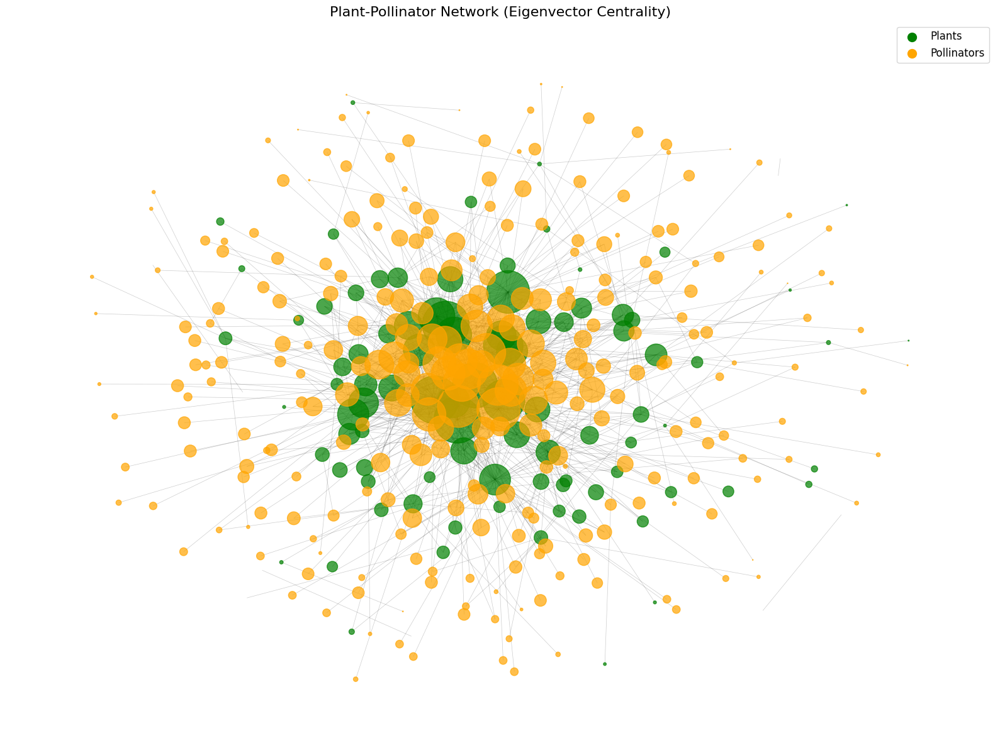

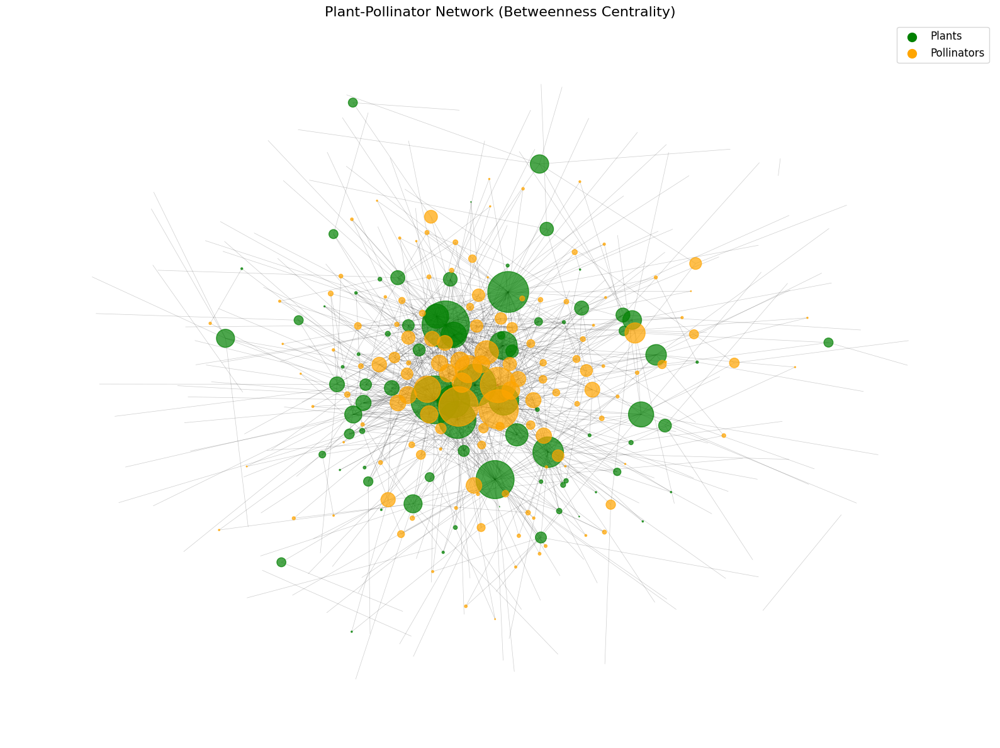

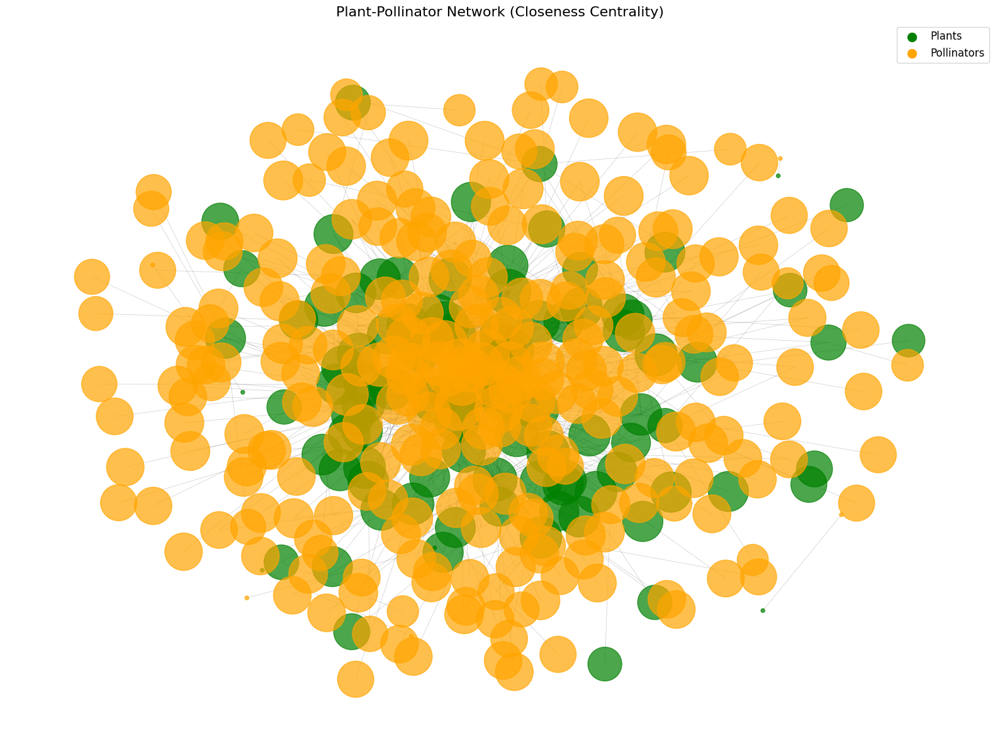

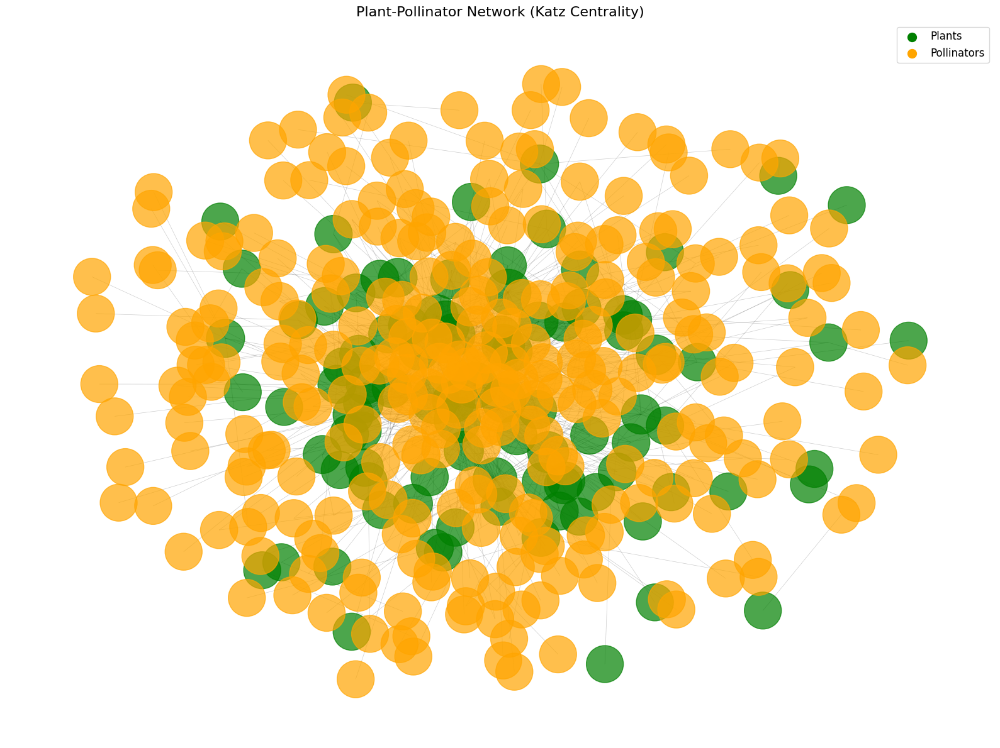

/usr/local/lib/python3.11/dist-packages/matplotlib/collections.py:1008: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


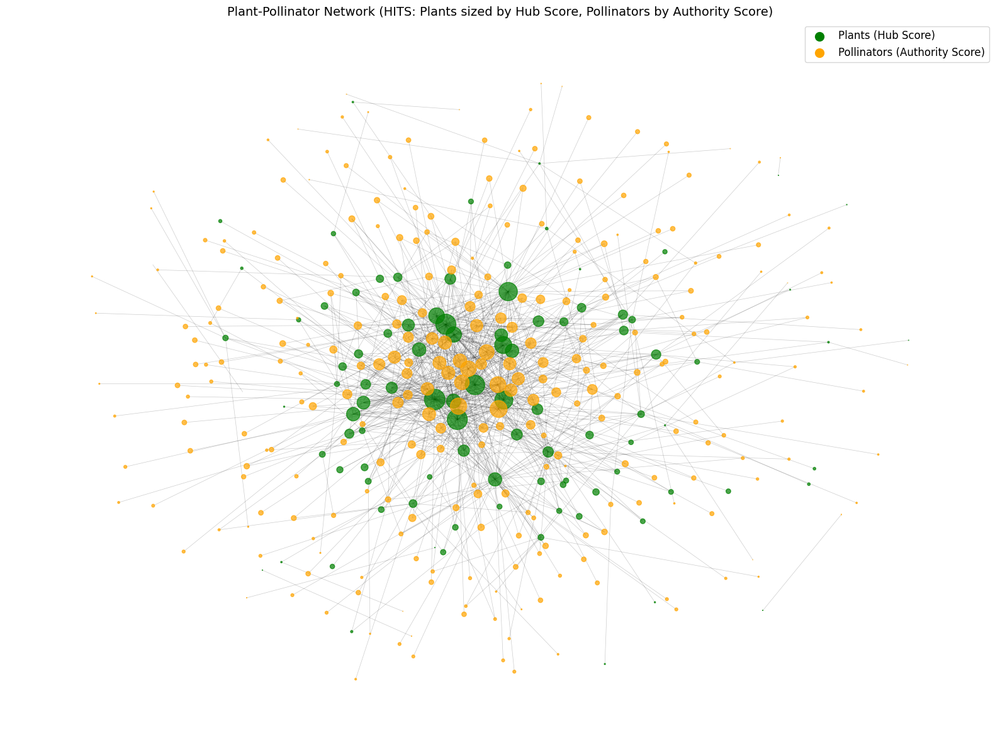

In [ ]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns

# === Step 1: Load and Prepare the Data ===
file_path = "M_PL_005.csv"
df = pd.read_csv(file_path, index_col=0)
interaction_matrix = df.fillna(0).astype(int)

# Extract plant and pollinator nodes
plants = interaction_matrix.index.tolist()
pollinators = interaction_matrix.columns.tolist()

# === Step 2: Construct the Bipartite Network ===
B = nx.Graph()
B.add_nodes_from(plants, bipartite=0)
B.add_nodes_from(pollinators, bipartite=1)

for plant in plants:
    for pollinator in pollinators:
        if interaction_matrix.loc[plant, pollinator] == 1:
            B.add_edge(plant, pollinator)

# === Step 3: Compute Centrality Metrics ===
# Calculate various centrality measures with error handling
try:
    eigenvector_centrality = nx.eigenvector_centrality(B, max_iter=1000)
except nx.PowerIterationFailedConvergence:
    # Find largest connected component if eigenvector calculation fails
    largest_cc = max(nx.connected_components(B), key=len)
    B_sub = B.subgraph(largest_cc)
    eigenvector_centrality = {node: 0.0 for node in B.nodes()}
    sub_centrality = nx.eigenvector_centrality(B_sub, max_iter=1000)
    eigenvector_centrality.update(sub_centrality)

# Katz centrality (with lower alpha to ensure convergence)
katz_centrality = nx.katz_centrality(B, alpha=0.01)

# Betweenness centrality
betweenness_centrality = nx.betweenness_centrality(B)

# Closeness centrality
closeness_centrality = nx.closeness_centrality(B)

# HITS (Hub and Authority scores)
hits_hub, hits_authority = nx.hits(B, max_iter=1000)

# === Step 4: Separate centrality results for plants and pollinators ===
def get_top_nodes(centrality_dict, node_list, n=10):
    """Get top n nodes from a centrality dictionary for a specific node list"""
    filtered_dict = {node: centrality_dict[node] for node in node_list if node in centrality_dict}
    return sorted(filtered_dict.items(), key=lambda x: x[1], reverse=True)[:n]

# Get top plants and pollinators for each centrality measure
top_plants_eigenvector = get_top_nodes(eigenvector_centrality, plants)
top_pollinators_eigenvector = get_top_nodes(eigenvector_centrality, pollinators)

top_plants_katz = get_top_nodes(katz_centrality, plants)
top_pollinators_katz = get_top_nodes(katz_centrality, pollinators)

top_plants_betweenness = get_top_nodes(betweenness_centrality, plants)
top_pollinators_betweenness = get_top_nodes(betweenness_centrality, pollinators)

top_plants_closeness = get_top_nodes(closeness_centrality, plants)
top_pollinators_closeness = get_top_nodes(closeness_centrality, pollinators)

top_plants_hub = get_top_nodes(hits_hub, plants)
top_pollinators_authority = get_top_nodes(hits_authority, pollinators)

# === Step 5: Visualize Network with Different Centrality Measures ===

# Function to visualize network with a specific centrality measure
def visualize_network_with_centrality(G, centrality_dict, title, plants, pollinators):
    plt.figure(figsize=(16, 12))

    # Normalize centrality for node sizing
    max_centrality = max(centrality_dict.values())
    node_sizes = [3000 * centrality_dict[node] / max_centrality for node in G.nodes()]

    # Node colors (blue for plants, green for pollinators)
    node_colors = ['green' if node in plants else 'orange' for node in G.nodes()]

    # Create layout
    pos = nx.spring_layout(G, seed=42, k=0.3)

    # Draw the network
    nx.draw_networkx_edges(G, pos, alpha=0.2, width=0.5)
    nx.draw_networkx_nodes(
        G,
        pos,
        node_size=node_sizes,
        node_color=node_colors,
        alpha=0.7
    )

    # Title and legend
    plt.title(title, fontsize=16)
    plt.axis('off')

    # Add legend
    plt.scatter([], [], c='green', s=100, label='Plants')
    plt.scatter([], [], c='orange', s=100, label='Pollinators')
    plt.legend(fontsize=12)

    plt.tight_layout()
    plt.show()

# === Step 6: Create comparative visualizations ===

# Visualize network with Eigenvector Centrality
visualize_network_with_centrality(B, eigenvector_centrality,
                                 "Plant-Pollinator Network (Eigenvector Centrality)",
                                 plants, pollinators)

# Visualize network with Betweenness Centrality
visualize_network_with_centrality(B, betweenness_centrality,
                                 "Plant-Pollinator Network (Betweenness Centrality)",
                                 plants, pollinators)

# Visualize network with Closeness Centrality
visualize_network_with_centrality(B, closeness_centrality,
                                 "Plant-Pollinator Network (Closeness Centrality)",
                                 plants, pollinators)

# Visualize network with Katz Centrality
visualize_network_with_centrality(B, katz_centrality,
                                 "Plant-Pollinator Network (Katz Centrality)",
                                 plants, pollinators)

# Visualize network with HITS
plt.figure(figsize=(16, 12))

# Normalize hub and authority scores for node sizing
max_hub = max(hits_hub.values())
max_authority = max(hits_authority.values())

# Create node sizes based on role (hub for plants, authority for pollinators)
node_sizes = []
for node in B.nodes():
    if node in plants:
        size = 3000 * hits_hub[node] / max_hub
    else:  # pollinator
        size = 3000 * hits_authority[node] / max_authority
    node_sizes.append(size)

# Node colors
node_colors = ['green' if node in plants else 'orange' for node in B.nodes()]

# Create layout
pos = nx.spring_layout(B, seed=42, k=0.3)

# Draw the network
nx.draw_networkx_edges(B, pos, alpha=0.2, width=0.5)
nx.draw_networkx_nodes(
    B,
    pos,
    node_size=node_sizes,
    node_color=node_colors,
    alpha=0.7
)

# Title and legend
plt.title("Plant-Pollinator Network (HITS: Plants sized by Hub Score, Pollinators by Authority Score)", fontsize=14)
plt.axis('off')

# Add legend
plt.scatter([], [], c='green', s=100, label='Plants (Hub Score)')
plt.scatter([], [], c='orange', s=100, label='Pollinators (Authority Score)')
plt.legend(fontsize=12)

plt.tight_layout()
plt.show()


Number of nodes: 371 (96 plants and 275 pollinators)
Number of edges: 923
Average plant degree: 9.6
Average pollinator degree: 3.4


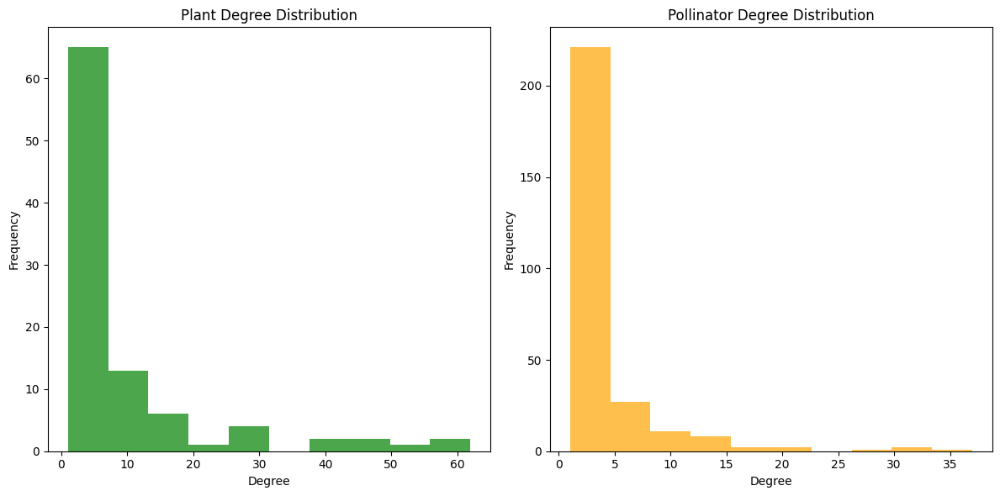


Top 10 Plants by Eigenvector Centrality: [('Rubus deliciosus', 0.2426124476590887), ('Geranium caespitosum', 0.2322854779914418), ('Rosa acicularis', 0.23109275144956717), ('Pentstemon glaber', 0.21672657275739618), ('Chamaenerium angustifolium', 0.1937746213887186), ('Pentstemon gracilis', 0.18572575279746392), ('Rubus strigosus', 0.166246547864155), ('Monarda fistulosa', 0.1421815233062443), ('Mertensia sibirica', 0.1343434572330315), ('Carduus hookerianus', 0.11211741790554032)]
Top 10 Pollinators by Eigenvector Centrality: [('Bombus edwardsi', 0.19955977739441116), ('Bombus occidentalis', 0.18612079472407775), ('Bombus hunti', 0.17553644480754177), ('Bombus juxtus', 0.1699049867823067), ('Bombus bifarius', 0.1532387860679266), ('Halictus pulzenus', 0.14845909475727362), ('Clisodon terminalis', 0.12746341895842403), ('Bombus appositus', 0.12057759048882268), ('Andrena madronitens', 0.11867791867556916), ('Monumetha albifrons', 0.1186519589805334)]

Top 10 Plants by Katz Centrality:

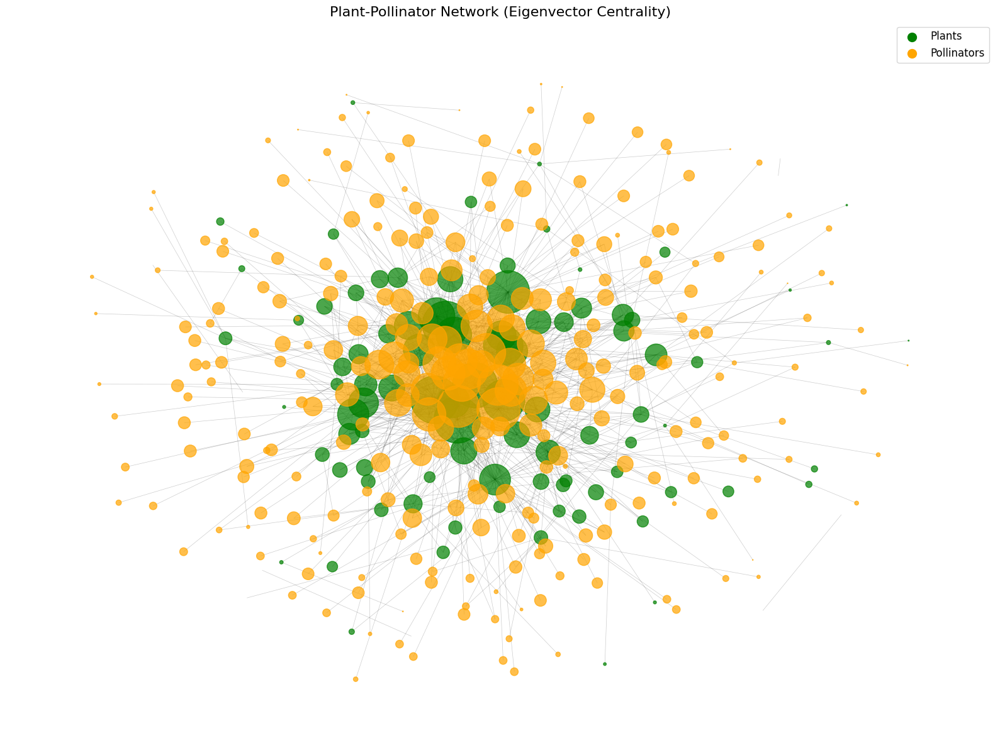

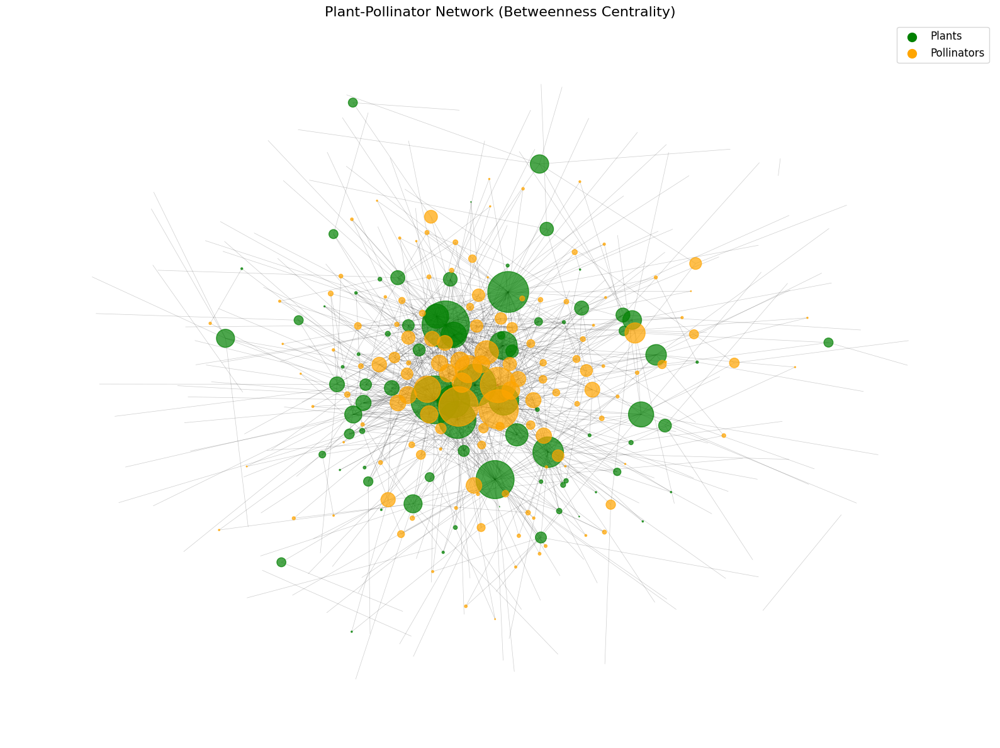

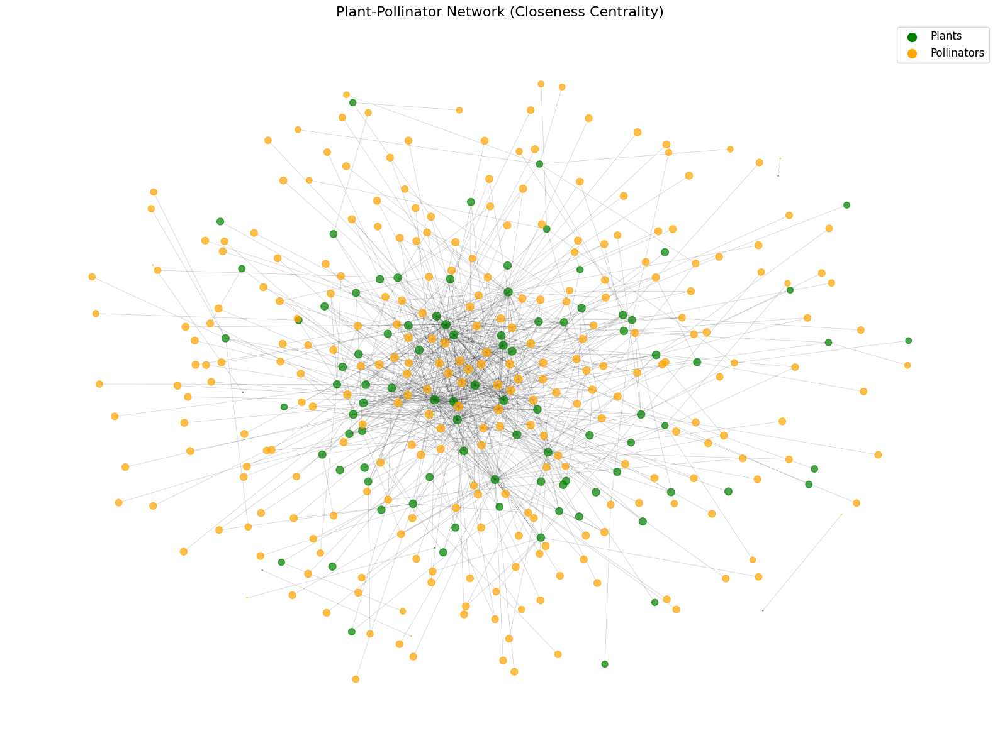

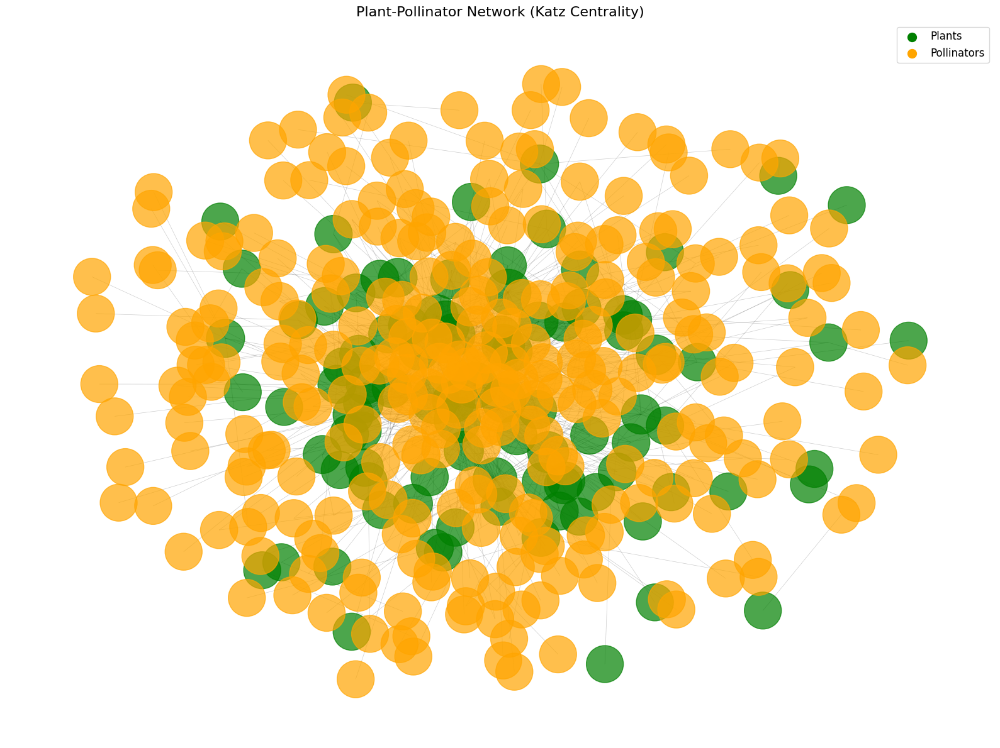

/usr/local/lib/python3.11/dist-packages/matplotlib/collections.py:1008: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


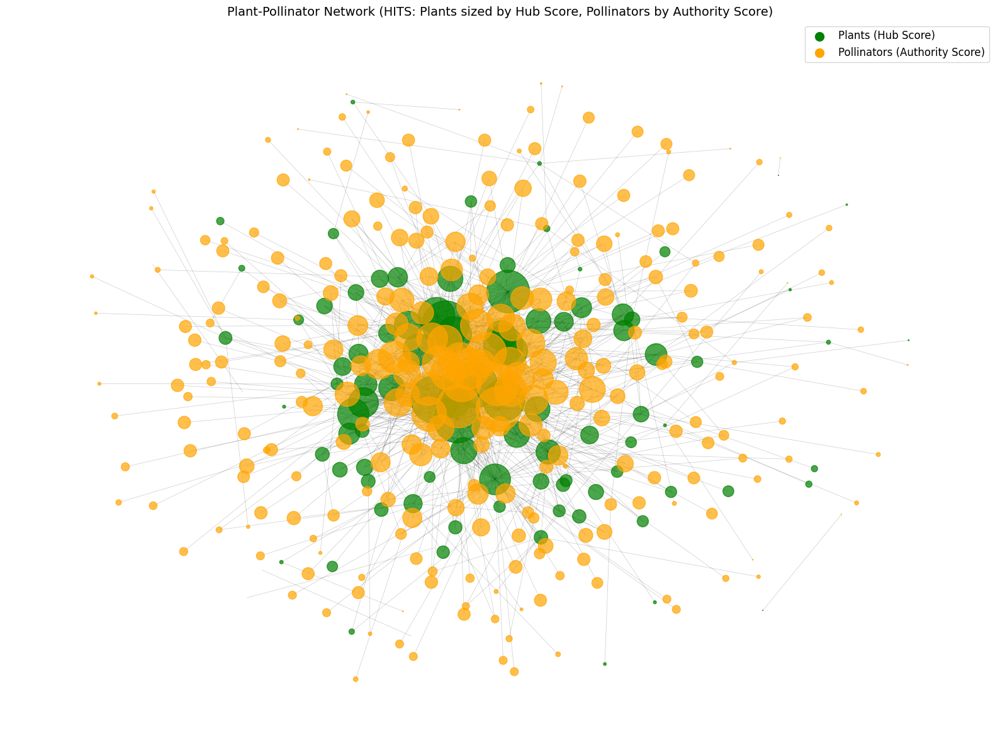

AttributeError: module 'community' has no attribute 'best_partition'

In [ ]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import community as community_louvain
from matplotlib.colors import LinearSegmentedColormap

# === Step 1: Load and Prepare the Data ===
file_path = "M_PL_005.csv"
df = pd.read_csv(file_path, index_col=0)
interaction_matrix = df.fillna(0).astype(int)

# Extract plant and pollinator nodes
plants = interaction_matrix.index.tolist()
pollinators = interaction_matrix.columns.tolist()

# === Step 2: Construct the Bipartite Network ===
B = nx.Graph()
B.add_nodes_from(plants, bipartite=0)
B.add_nodes_from(pollinators, bipartite=1)

for plant in plants:
    for pollinator in pollinators:
        if interaction_matrix.loc[plant, pollinator] == 1:
            B.add_edge(plant, pollinator)

# === Step 3: Basic Network Metrics ===
num_nodes = B.number_of_nodes()
num_edges = B.number_of_edges()
plant_degrees = [B.degree(node) for node in plants]
pollinator_degrees = [B.degree(node) for node in pollinators]
avg_plant_degree = np.mean(plant_degrees)
avg_pollinator_degree = np.mean(pollinator_degrees)

print(f"Number of nodes: {num_nodes} ({len(plants)} plants and {len(pollinators)} pollinators)")
print(f"Number of edges: {num_edges}")
print(f"Average plant degree: {avg_plant_degree:.1f}")
print(f"Average pollinator degree: {avg_pollinator_degree:.1f}")

# === Step 4: Degree Distribution Analysis ===
plt.figure(figsize=(12, 6))

# Plot plant degree distribution
plt.subplot(1, 2, 1)
plt.hist(plant_degrees, bins=10, color='green', alpha=0.7)
plt.title('Plant Degree Distribution')
plt.xlabel('Degree')
plt.ylabel('Frequency')

# Plot pollinator degree distribution
plt.subplot(1, 2, 2)
plt.hist(pollinator_degrees, bins=10, color='orange', alpha=0.7)
plt.title('Pollinator Degree Distribution')
plt.xlabel('Degree')
plt.ylabel('Frequency')

plt.tight_layout()
plt.savefig('degree_distribution.png')
plt.show()

# === Step 5: Compute Centrality Metrics ===
# Calculate various centrality measures with error handling
try:
    eigenvector_centrality = nx.eigenvector_centrality(B, max_iter=1000)
except nx.PowerIterationFailedConvergence:
    # Find largest connected component if eigenvector calculation fails
    largest_cc = max(nx.connected_components(B), key=len)
    B_sub = B.subgraph(largest_cc)
    eigenvector_centrality = {node: 0.0 for node in B.nodes()}
    sub_centrality = nx.eigenvector_centrality(B_sub, max_iter=1000)
    eigenvector_centrality.update(sub_centrality)

# Katz centrality (with lower alpha to ensure convergence)
katz_centrality = nx.katz_centrality(B, alpha=0.01)

# Betweenness centrality
betweenness_centrality = nx.betweenness_centrality(B)

# Closeness centrality
closeness_centrality = nx.closeness_centrality(B)

# HITS (Hub and Authority scores)
hits_hub, hits_authority = nx.hits(B, max_iter=1000)

# === Step 6: Separate centrality results for plants and pollinators ===
def get_top_nodes(centrality_dict, node_list, n=10):
    """Get top n nodes from a centrality dictionary for a specific node list"""
    filtered_dict = {node: centrality_dict[node] for node in node_list if node in centrality_dict}
    return sorted(filtered_dict.items(), key=lambda x: x[1], reverse=True)[:n]

# Get top plants and pollinators for each centrality measure
top_plants_eigenvector = get_top_nodes(eigenvector_centrality, plants)
top_pollinators_eigenvector = get_top_nodes(eigenvector_centrality, pollinators)

top_plants_katz = get_top_nodes(katz_centrality, plants)
top_pollinators_katz = get_top_nodes(katz_centrality, pollinators)

top_plants_betweenness = get_top_nodes(betweenness_centrality, plants)
top_pollinators_betweenness = get_top_nodes(betweenness_centrality, pollinators)

top_plants_closeness = get_top_nodes(closeness_centrality, plants)
top_pollinators_closeness = get_top_nodes(closeness_centrality, pollinators)

top_plants_hub = get_top_nodes(hits_hub, plants)
top_pollinators_authority = get_top_nodes(hits_authority, pollinators)

# Print results
print("\nTop 10 Plants by Eigenvector Centrality:", top_plants_eigenvector)
print("Top 10 Pollinators by Eigenvector Centrality:", top_pollinators_eigenvector)

print("\nTop 10 Plants by Katz Centrality:", top_plants_katz)
print("Top 10 Pollinators by Katz Centrality:", top_pollinators_katz)

print("\nTop 10 Plants by Betweenness Centrality:", top_plants_betweenness)
print("Top 10 Pollinators by Betweenness Centrality:", top_pollinators_betweenness)

print("\nTop 10 Plants by Closeness Centrality:", top_plants_closeness)
print("Top 10 Pollinators by Closeness Centrality:", top_pollinators_closeness)

print("\nTop 10 Plants by Hub Scores (HITS):", top_plants_hub)
print("Top 10 Pollinators by Authority Scores (HITS):", top_pollinators_authority)

# === Step 7: Visualize Network with Different Centrality Measures ===
def visualize_network_with_centrality(G, centrality_dict, title, plants, pollinators, size_factor=3000):
    plt.figure(figsize=(16, 12))

    # Normalize centrality for node sizing
    max_centrality = max(centrality_dict.values())
    node_sizes = [size_factor * centrality_dict[node] / max_centrality for node in G.nodes()]

    # Node colors
    node_colors = ['green' if node in plants else 'orange' for node in G.nodes()]

    # Create layout
    pos = nx.spring_layout(G, seed=42, k=0.3)

    # Draw the network
    nx.draw_networkx_edges(G, pos, alpha=0.2, width=0.5)
    nx.draw_networkx_nodes(
        G,
        pos,
        node_size=node_sizes,
        node_color=node_colors,
        alpha=0.7
    )

    # Title and legend
    plt.title(title, fontsize=16)
    plt.axis('off')

    # Add legend
    plt.scatter([], [], c='green', s=100, label='Plants')
    plt.scatter([], [], c='orange', s=100, label='Pollinators')
    plt.legend(fontsize=12)

    plt.tight_layout()
    plt.savefig(f"{title.replace(' ', '_').replace('(', '').replace(')', '')}.png")
    plt.show()

# Visualize network with Eigenvector Centrality
visualize_network_with_centrality(B, eigenvector_centrality,
                                 "Plant-Pollinator Network (Eigenvector Centrality)",
                                 plants, pollinators)

# Visualize network with Betweenness Centrality
visualize_network_with_centrality(B, betweenness_centrality,
                                 "Plant-Pollinator Network (Betweenness Centrality)",
                                 plants, pollinators)

# Visualize network with Closeness Centrality
visualize_network_with_centrality(B, closeness_centrality,
                                 "Plant-Pollinator Network (Closeness Centrality)",
                                 plants, pollinators, size_factor=100)

# Visualize network with Katz Centrality
visualize_network_with_centrality(B, katz_centrality,
                                 "Plant-Pollinator Network (Katz Centrality)",
                                 plants, pollinators)

# Visualize network with HITS
plt.figure(figsize=(16, 12))

# Normalize hub and authority scores for node sizing
max_hub = max(hits_hub.values())
max_authority = max(hits_authority.values())

# Create node sizes based on role (hub for plants, authority for pollinators)
node_sizes = []
for node in B.nodes():
    if node in plants:
        size = 3000 * hits_hub[node] / max_hub
    else:  # pollinator
        size = 3000 * hits_authority[node] / max_authority
    node_sizes.append(size)

# Node colors
node_colors = ['green' if node in plants else 'orange' for node in B.nodes()]

# Create layout
pos = nx.spring_layout(B, seed=42, k=0.3)

# Draw the network
nx.draw_networkx_edges(B, pos, alpha=0.2, width=0.5)
nx.draw_networkx_nodes(
    B,
    pos,
    node_size=node_sizes,
    node_color=node_colors,
    alpha=0.7
)

# Title and legend
plt.title("Plant-Pollinator Network (HITS: Plants sized by Hub Score, Pollinators by Authority Score)", fontsize=14)
plt.axis('off')

# Add legend
plt.scatter([], [], c='green', s=100, label='Plants (Hub Score)')
plt.scatter([], [], c='orange', s=100, label='Pollinators (Authority Score)')
plt.legend(fontsize=12)

plt.tight_layout()
plt.savefig("Plant_Pollinator_Network_HITS.png")
plt.show()

# === Step 8: Community Detection ===
# Apply Louvain community detection
communities = community_louvain.best_partition(B)
modularity = community_louvain.modularity(communities, B)

# Count communities
num_communities = len(set(communities.values()))
print(f"\nNumber of communities: {num_communities}")
print(f"Modularity score: {modularity:.3f}")

# Visualize communities
plt.figure(figsize=(16, 12))

# Create a colormap for communities
cmap = plt.cm.get_cmap('viridis', num_communities)
node_colors = [cmap(communities[node]) for node in B.nodes()]

# Node shapes (circles for plants, squares for pollinators)
node_shapes = ['o' if node in plants else 's' for node in B.nodes()]
plant_nodes = [node for node in B.nodes() if node in plants]
pollinator_nodes = [node for node in B.nodes() if node in pollinators]

# Create layout
pos = nx.spring_layout(B, seed=42, k=0.3)

# Draw edges
nx.draw_networkx_edges(B, pos, alpha=0.2, width=0.5)

# Draw nodes by type and community
for shape in set(node_shapes):
    node_list = [node for i, node in enumerate(B.nodes()) if node_shapes[i] == shape]
    node_color = [cmap(communities[node]) for node in node_list]
    nx.draw_networkx_nodes(
        B, pos,
        nodelist=node_list,
        node_color=node_color,
        node_shape=shape,
        node_size=100,
        alpha=0.8
    )

plt.title(f"Plant-Pollinator Network Communities (Modularity = {modularity:.3f})", fontsize=16)
plt.axis('off')

# Add legend
plt.scatter([], [], c='green', s=100, marker='o', label='Plants')
plt.scatter([], [], c='orange', s=100, marker='s', label='Pollinators')
plt.legend(fontsize=12)

plt.tight_layout()
plt.savefig("Community_Structure.png")
plt.show()

# === Step 9: Assortativity Analysis ===
# Calculate degree assortativity for plants and pollinators
plant_assortativity = nx.degree_assortativity_coefficient(B, nodes=plants)
pollinator_assortativity = nx.degree_assortativity_coefficient(B, nodes=pollinators)

print(f"\nDegree assortativity for plants: {plant_assortativity:.2f}")
print(f"Degree assortativity for pollinators: {pollinator_assortativity:.2f}")

# Calculate and plot average neighbor degree vs. node degree
avg_neighbor_degrees = nx.average_neighbor_degree(B)

# Separate by node type
plant_degrees = [B.degree(node) for node in plants]
plant_neighbor_degrees = [avg_neighbor_degrees[node] for node in plants]

pollinator_degrees = [B.degree(node) for node in pollinators]
pollinator_neighbor_degrees = [avg_neighbor_degrees[node] for node in pollinators]

plt.figure(figsize=(16, 6))
plt.scatter(plant_degrees, plant_neighbor_degrees, c='green', alpha=0.7, label='Plants')
plt.scatter(pollinator_degrees, pollinator_neighbor_degrees, c='orange', alpha=0.7, label='Pollinators')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Node Degree', fontsize=14)
plt.ylabel('Average Neighbor Degree', fontsize=14)
plt.title('Degree Assortativity', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig("Assortativity.png")
plt.show()

# === Step 10: Clustering Coefficients ===
# Calculate global clustering coefficients
plant_subgraph = B.subgraph(plants)
pollinator_subgraph = B.subgraph(pollinators)

plant_clustering = nx.transitivity(plant_subgraph)
pollinator_clustering = nx.transitivity(pollinator_subgraph)

print(f"\nGlobal clustering coefficient (transitivity) for plants: {plant_clustering:.4f}")
print(f"Global clustering coefficient (transitivity) for pollinators: {pollinator_clustering:.4f}")

# Calculate local clustering coefficients
clustering = nx.clustering(B)

# Separate by node type
plant_local_clustering = {node: clustering[node] for node in plants}
pollinator_local_clustering = {node: clustering[node] for node in pollinators}

# Plot local clustering coefficient vs. degree
plt.figure(figsize=(16, 6))

plt.scatter([B.degree(node) for node in plants], list(plant_local_clustering.values()),
            c='green', alpha=0.7, label='Plants')
plt.scatter([B.degree(node) for node in pollinators], list(pollinator_local_clustering.values()),
            c='orange', alpha=0.7, label='Pollinators')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Node Degree', fontsize=14)
plt.ylabel('Local Clustering Coefficient', fontsize=14)
plt.title('Local Clustering Coefficient vs. Degree', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig("Clustering_Coefficients.png")
plt.show()
